In [2]:
import sys
import os, PATH
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

import warnings

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
from src._configure import Yaml_configurer

sys.path.append(os.path.join(PATH.main_dir, "script"))

from script.main_train_with_PL_trainer import dl_from_config, get_model_from_config, get_sampler_from_configs
import PATH
from src import _diffplot as dfp
import pandas as pd

/home/wergillius/Project/diffuse_differentiate/script/path_n_util.py
/home/wergillius/Project/diffuse_differentiate/machine_config.json


In [4]:
adata = sc.read_h5ad(os.path.join(PATH.main_dir, "data/TFAtlas/differentiated_model_velo.h5ad"))

In [5]:
adata

AnnData object with n_obs × n_vars = 28825 × 4806
    obs: 'TF', 'batch', 'louvain', 'n_counts', 'n_genes', 'percent_mito', 'dpt_pseudotime', 'discrete_time', 'split', 'velocity_self_transition', 'is_large', 'Cluster Enriched TFs', 'course_louvain', 'course_cell_type'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Cluster Enriched TFs_colors', 'batch_colors', 'diffmap_evals', 'hvg', 'iroot', 'is_large_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'unique_token_dict', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_diffmap', 'X_pca', 'X_pca_harmony', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'X', 'velocity'
    obsp: 'connectivities', 'distances'

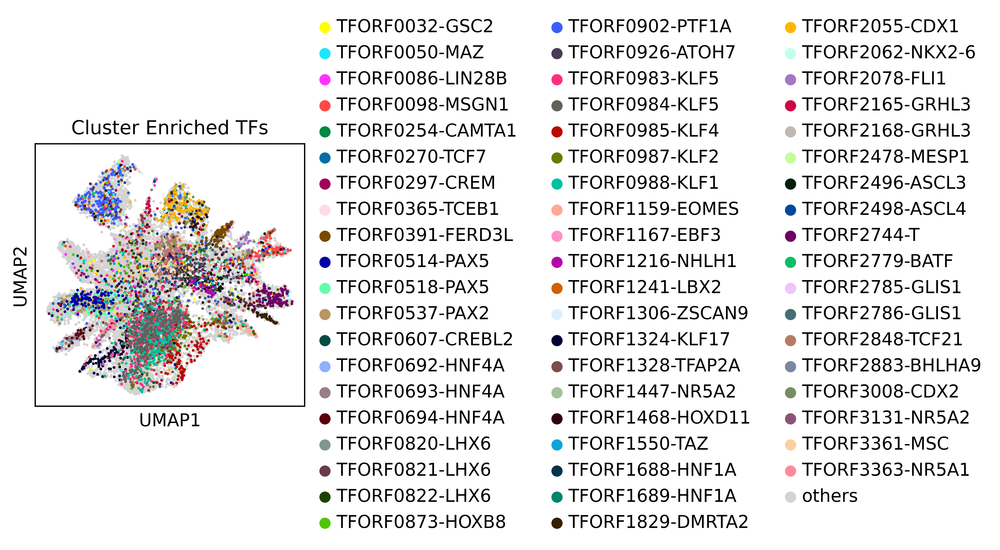

In [155]:
fig, ax = plt.subplots(1,1, figsize=(3,3), dpi=300)
sc.pl.umap(adata[a], 
           size = 12, color="Cluster Enriched TFs", 
           ax=ax, return_fig = False)

# **Cell rank**

In [6]:
from cellrank.tl import kernels

In [11]:
class MyKernel(cr.tl.kernels.Kernel):
    def compute_transition_matrix(self, some_parameter: float = 0.5) -> "MyKernel":
        transition_matrix = self.adata.uns['velocity_graph']
        self._compute_transition_matrix(transition_matrix, density_normalize=True)
        return self

    def copy(self) -> "MyKernel":
        return copy(self)

In [12]:
k = MyKernel(adata).compute_transition_matrix()
k.transition_matrix.A

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [7]:
adata

AnnData object with n_obs × n_vars = 28825 × 4806
    obs: 'TF', 'batch', 'louvain', 'n_counts', 'n_genes', 'percent_mito', 'dpt_pseudotime', 'discrete_time', 'split', 'velocity_self_transition', 'is_large', 'Cluster Enriched TFs', 'course_louvain', 'course_cell_type'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Cluster Enriched TFs_colors', 'batch_colors', 'diffmap_evals', 'hvg', 'iroot', 'is_large_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'unique_token_dict', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_diffmap', 'X_pca', 'X_pca_harmony', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'X', 'velocity'
    obsp: 'connectivities', 'distances'

In [9]:
vk = kernels.VelocityKernel(adata, xkey='X').compute_transition_matrix()
adata.obsp['velo_kernel_transition'] = vk.transition_matrix

Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


100%|██████████| 28825/28825 [02:06<00:00, 227.33cell/s]


Setting `softmax_scale=89.0519`


100%|██████████| 28825/28825 [02:04<00:00, 231.32cell/s]


    Finish (0:05:02)


The 'monte_carlo` mode will take a days to run

``` python
vk_mc = kernels.VelocityKernel(adata,xkey='X').compute_transition_matrix(mode='monte_carlo')

```

In [11]:
ck = kernels.ConnectivityKernel(adata).compute_transition_matrix()

Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


In [12]:
pk = kernels.PseudotimeKernel(adata).compute_transition_matrix()

Computing transition matrix based on `dpt_pseudotime`


100%|██████████| 28825/28825 [00:07<00:00, 3942.84cell/s]


    Finish (0:00:13)


In [14]:
combined_kernel = 0.8 * vk + 0.1 * ck + 0.1 * pk

In [15]:
from cellrank.tl.estimators import GPCCA

g = GPCCA(combined_kernel)
print(g)

GPCCA[n=28825, kernel=((0.8 * <VelocityKernel[softmax_scale=89.05, mode=deterministic, seed=17518, scheme=<CorrelationScheme>]>) + (0.1 * <ConnectivityKernel[dnorm=True, key=connectivities]>) + (0.1 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>))]


Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:02)


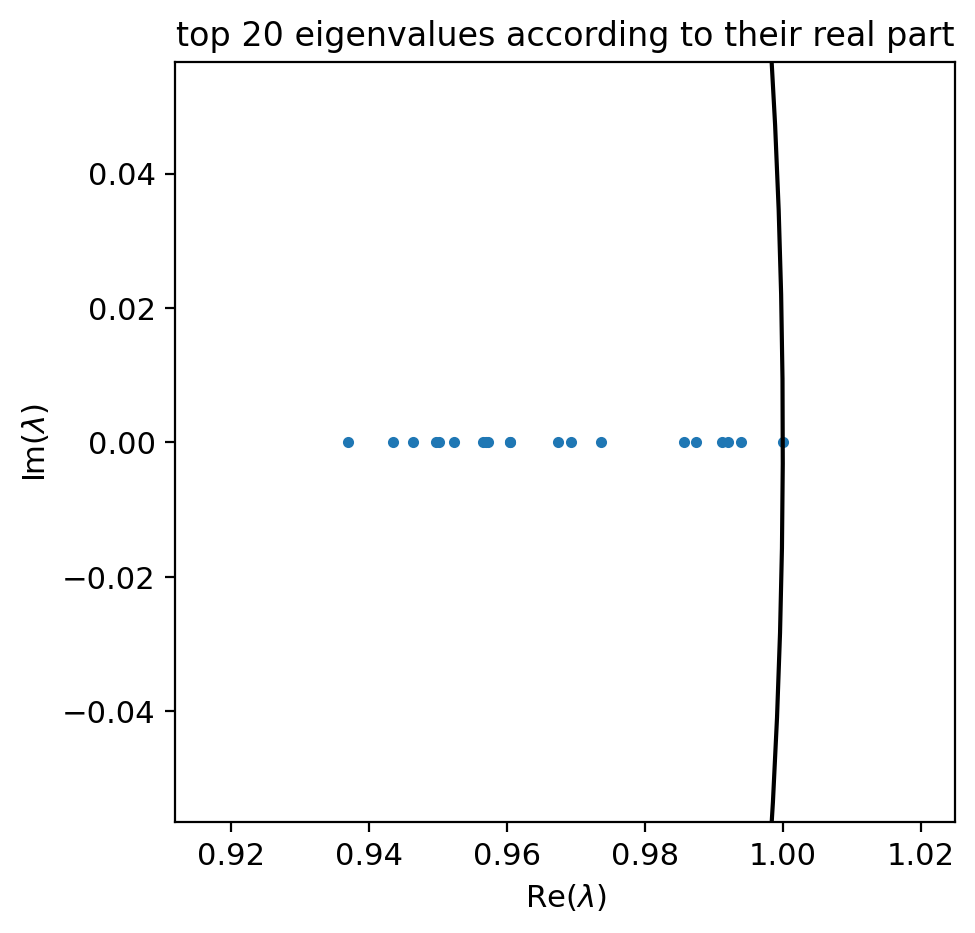

In [16]:
g.compute_schur(n_components=20)
g.plot_spectrum()

Computing `6` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:02)


/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


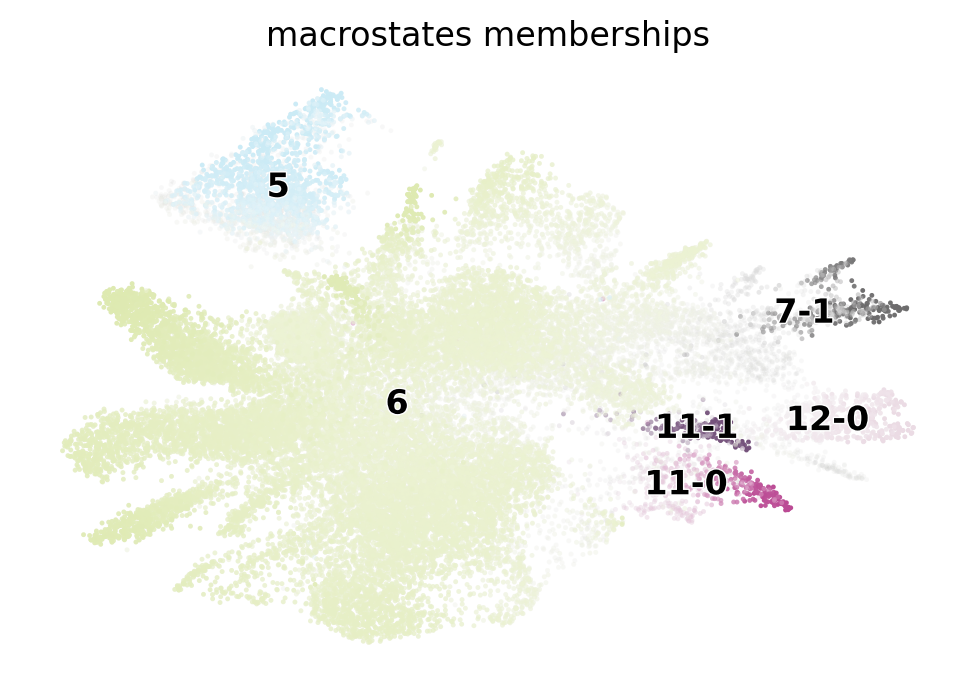

In [63]:
g.compute_macrostates(n_states=6, cluster_key="louvain")
g.plot_macrostates()

/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


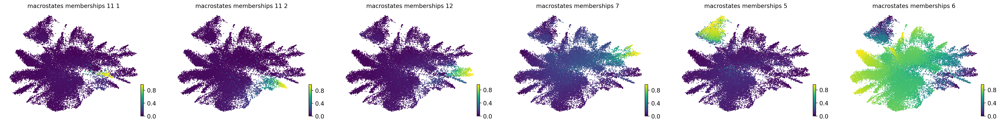

In [21]:
g.plot_macrostates(same_plot=False)

In [64]:
g.compute_terminal_states()

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


In [65]:
g.compute_absorption_probabilities(use_petsc=True, solver='gmres')

Computing absorption probabilities


100%|██████████| 6/6 [00:01<00:00,  4.47/s]


Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:01)


In [57]:
adata.obs['terminal_states']

R1.11,R2.75,R3.53,P1.54-0-1-0    NaN
R1.57,R2.65,R3.85,P1.62-1-1-0    NaN
R1.36,R2.43,R3.03,P1.07-2-1-0    NaN
R1.30,R2.78,R3.32,P1.31-1-2-0    NaN
R1.87,R2.31,R3.93,P1.31-1-2-0    NaN
                                ... 
R1.09,R2.52,R3.46,P1.38-2-1      NaN
R1.27,R2.20,R3.51,P1.38-2-1      NaN
R1.55,R2.61,R3.86,P1.38-2-1      NaN
R1.29,R2.64,R3.18,P1.62-3-1      NaN
R1.52,R2.33,R3.67,P1.62-3-1      NaN
Name: terminal_states, Length: 28825, dtype: category
Categories (6, object): ['11_1', '11_2', '12', '7', '5', '6']

In [68]:
for i, n in enumerate(g.absorption_probabilities.names):
    adata.obs[f'member_{n}_absorption'] = g.absorption_probabilities.X[:,i]

# **Analysis of member 5**

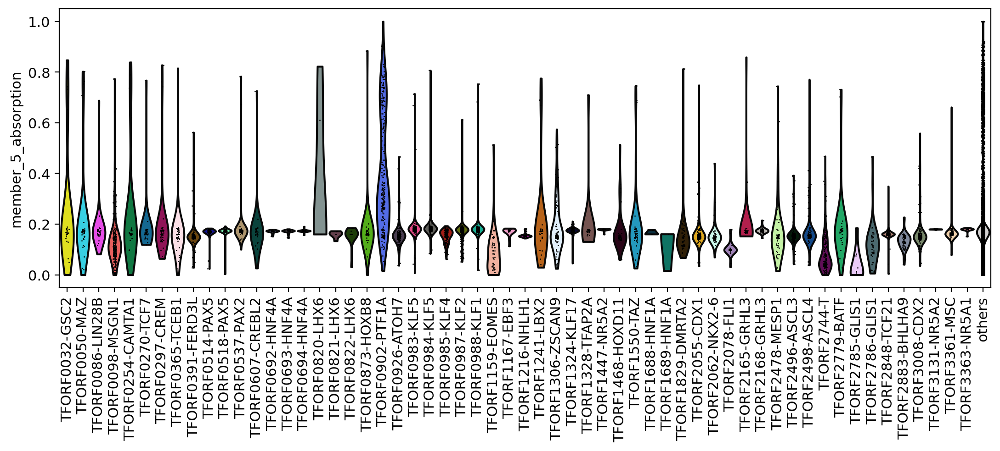

In [83]:
fig, ax = plt.subplots(1,1, figsize=(13,4))
sc.pl.violin(adata, keys='member_5_absorption',
             groupby='Cluster Enriched TFs',
             ax=ax, return_fig=False, rotation=90
            )

In [86]:
g.compute_lineage_drivers("5")

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:05)


,5_corr,5_pval,5_qval,5_ci_low,5_ci_high
NTS,0.392713,0.000000e+00,0.000000e+00,0.382905,0.402433
HAPLN1,0.367065,0.000000e+00,0.000000e+00,0.357034,0.377012
TBX15,0.359640,0.000000e+00,0.000000e+00,0.349547,0.369650
SNAI2,0.271747,0.000000e+00,0.000000e+00,0.261021,0.282405
FAM65B,0.258886,0.000000e+00,0.000000e+00,0.248084,0.269625
...,...,...,...,...,...
ALPK2,-0.111603,1.035683e-80,8.295820e-79,-0.122989,-0.100188
LOC101927973,-0.117243,5.922764e-89,5.474000e-87,-0.128613,-0.105842
LOC284825,-0.122878,1.313967e-97,1.435210e-95,-0.134232,-0.111492
LOC102724419,-0.124160,1.231877e-99,1.376837e-97,-0.135510,-0.112777


/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


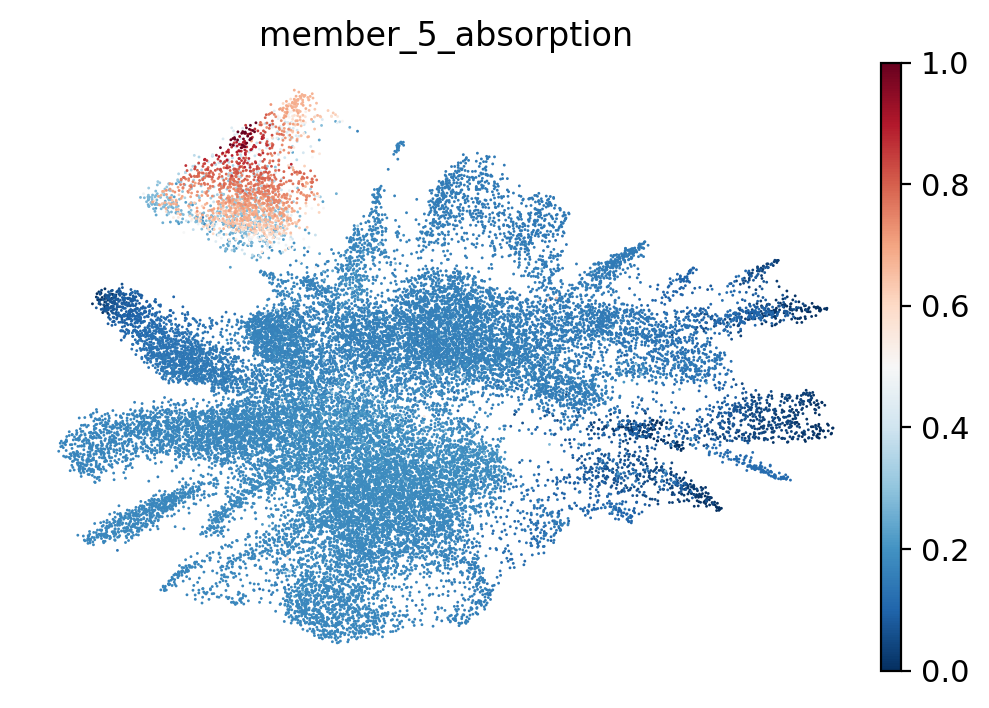

In [85]:
fig, ax = plt.subplots(1,1)
sc.pl.umap(adata, color = ['member_5_absorption'], 
           ax=ax, frameon = False, return_fig=False)


# **Analysis of member 7**

In [47]:
import matplotlib.pyplot as plt

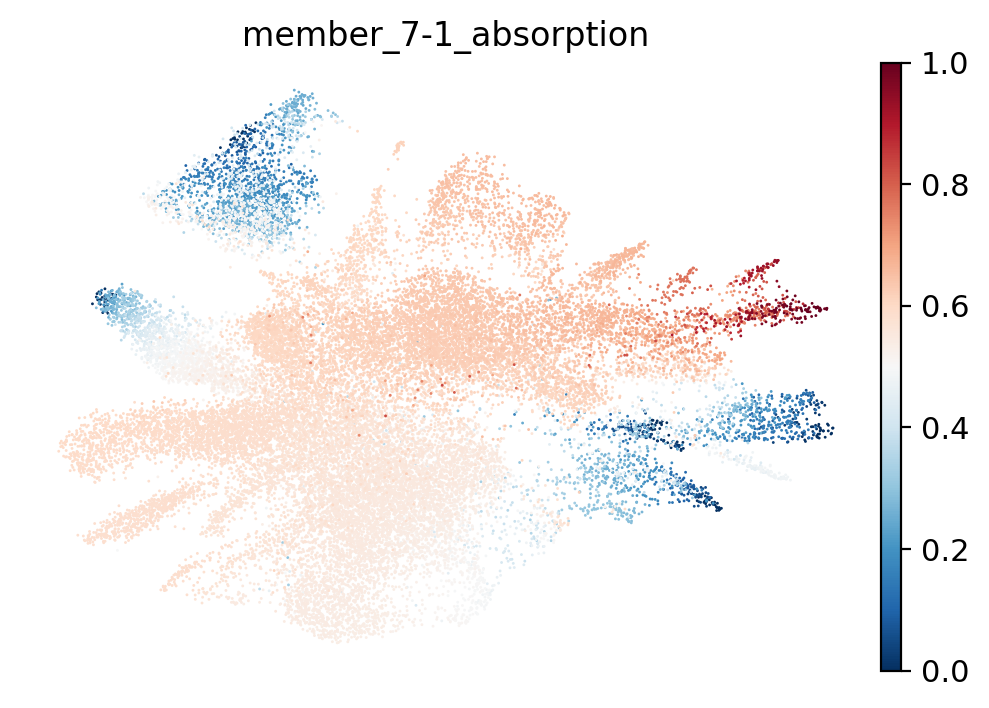

In [69]:
fig, ax = plt.subplots(1,1)
sc.pl.umap(adata, color = ['member_7-1_absorption'], 
           ax=ax, frameon = False, return_fig=False)


In [70]:
g.compute_lineage_drivers("7-1")

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:05)


,7-1_corr,7-1_pval,7-1_qval,7-1_ci_low,7-1_ci_high
COL3A1,0.213381,2.556018e-296,7.677639e-294,0.202335,0.224373
GREB1L,0.205414,3.921450e-274,1.047027e-271,0.194331,0.216445
ADGRL4,0.162098,1.169667e-169,1.561506e-167,0.150836,0.173318
CDH6,0.154316,1.071900e-153,1.320910e-151,0.143027,0.165565
DACH1,0.137057,2.965917e-121,2.336754e-119,0.125712,0.148366
...,...,...,...,...,...
LOC101927973,-0.280442,0.000000e+00,0.000000e+00,-0.291044,-0.269771
LINC00458,-0.288472,0.000000e+00,0.000000e+00,-0.299021,-0.277853
NTS,-0.290161,0.000000e+00,0.000000e+00,-0.300698,-0.279553
LOC284825,-0.297628,0.000000e+00,0.000000e+00,-0.308113,-0.287070


/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


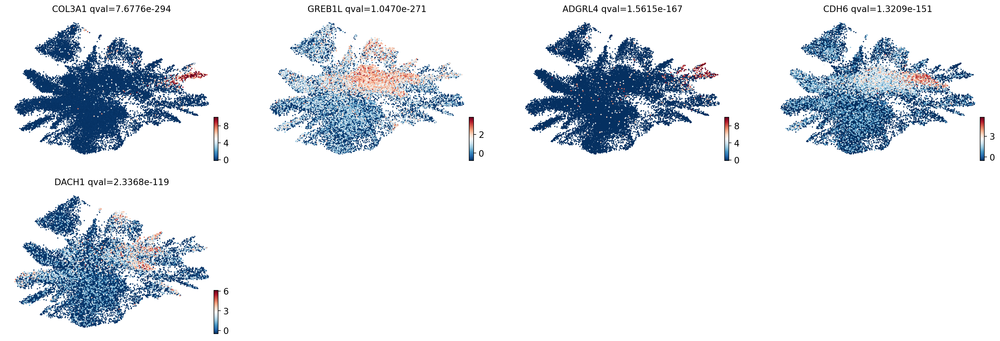

In [71]:
g.plot_lineage_drivers("7-1", n_genes=5)

Solving TSP for `6` states


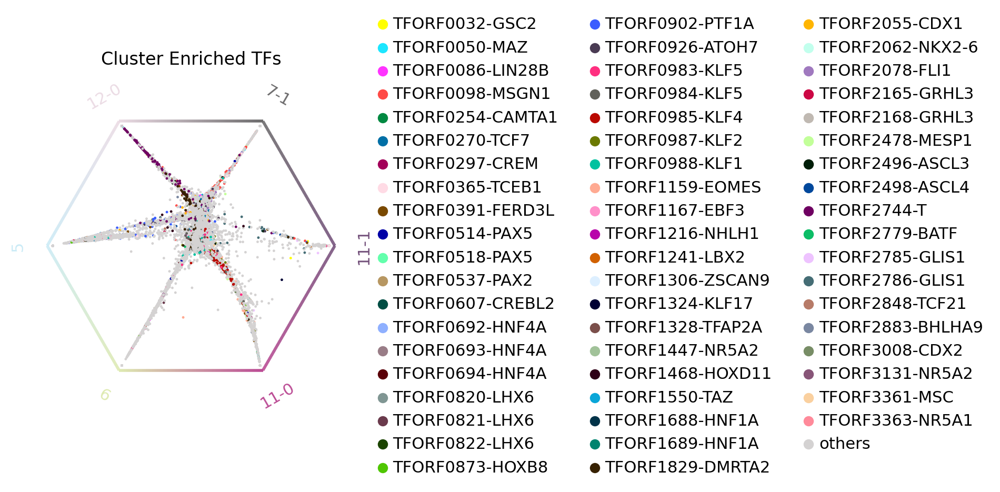

In [72]:
cr.pl.circular_projection(adata, keys="Cluster Enriched TFs", legend_loc="right")

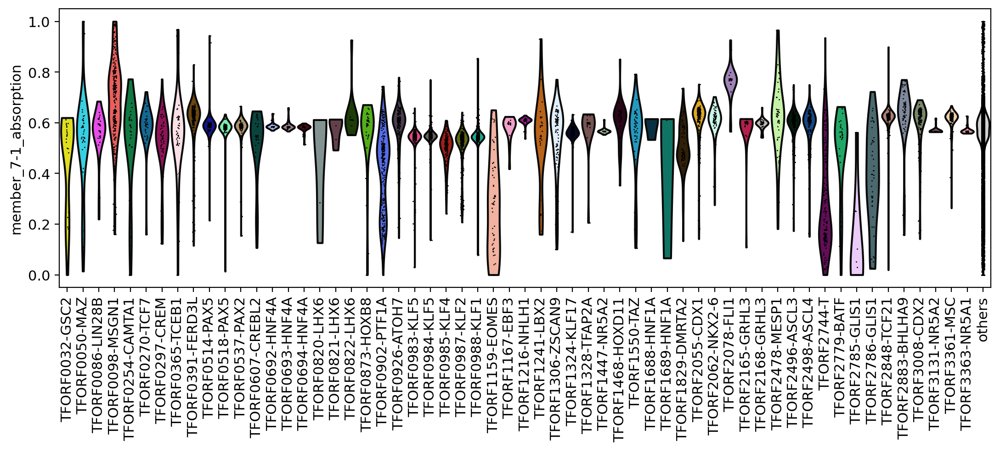

In [84]:
fig, ax = plt.subplots(1,1, figsize=(13,4))
sc.pl.violin(adata, keys='member_7-1_absorption',
             groupby='Cluster Enriched TFs',
             ax=ax, return_fig=False, rotation=90
            )

# some driver genes

In [198]:
alpha_drivers = g.compute_lineage_drivers(lineages="7", return_drivers=True)
alpha_drivers.sort_values(by="7_corr", ascending=False)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:14)


,7_corr,7_pval,7_qval,7_ci_low,7_ci_high
COL3A1,0.260075,0.000000e+00,0.000000e+00,0.249279,0.270806
ADGRL4,0.212673,2.615438e-294,1.142709e-291,0.201624,0.223668
AFF3,0.172753,7.041743e-193,1.880145e-190,0.161530,0.183930
MEF2C,0.168460,2.471583e-183,5.656395e-181,0.157222,0.179655
DLC1,0.167310,8.069199e-181,1.762753e-178,0.156067,0.178510
...,...,...,...,...,...
SNAI2,-0.240357,0.000000e+00,0.000000e+00,-0.251205,-0.229450
ZNF804A,-0.254155,0.000000e+00,0.000000e+00,-0.264922,-0.243325
HAPLN1,-0.308507,0.000000e+00,0.000000e+00,-0.318915,-0.298024
TBX15,-0.320628,0.000000e+00,0.000000e+00,-0.330947,-0.310232


In [213]:
np.intersect1d(g.lineage_drivers.index, ["NR2F2", "EPHB4", "NRP2", "APLNR"])

array(['APLNR', 'NR2F2', 'NRP2'], dtype=object)

In [218]:
np.intersect1d(g.lineage_drivers.index, ["GATA2", "RUNX1"])

array(['GATA2', 'RUNX1'], dtype=object)

In [216]:
np.intersect1d(g.lineage_drivers.index, ["SOX17", "GJA5", "EFNB2", "DLL4", "HEY1", "HEY2", "HES4"])

array(['EFNB2', 'HEY1'], dtype=object)

In [219]:
g.lineage_drivers.loc[["GATA2", "RUNX1"]]

,7_corr,7_pval,7_qval,7_ci_low,7_ci_high
GATA2,-0.005879,3.182524e-01,4.824630e-01,-0.017422,0.005666
RUNX1,0.038101,9.699434e-11,8.812000e-10,0.026568,0.049623


In [215]:
g.lineage_drivers.loc[['APLNR', 'NR2F2', 'NRP2']]

,7_corr,7_pval,7_qval,7_ci_low,7_ci_high
APLNR,0.083512,7.837283e-46,2.875266e-44,0.072037,0.094965
NR2F2,0.080640,7.703461e-43,2.553299e-41,0.069160,0.092098
NRP2,0.037889,1.230251e-10,1.109303e-09,0.026356,0.049412


In [217]:
g.lineage_drivers.loc[['EFNB2', 'HEY1']]

,7_corr,7_pval,7_qval,7_ci_low,7_ci_high
EFNB2,0.049088,7.406971e-17,1.019997e-15,0.037565,0.060598
HEY1,-0.119668,1.256100e-92,1.207364e-90,-0.131032,-0.108274


# <font size=5 color='navy'>**result saved here**

In [ ]:
# if can not save
# adata.obsm.pop['terminal_state']
# adata.obsm.pop['to_terminal_state']

In [46]:
adata.write_h5ad(
    os.path.join(PATH.main_dir, "data/TFAtlas/diff_cellrank_result.h5ad")
    )

# others

In [57]:
# index, remove batch label 
cell_type = pd.read_table(os.path.join(PATH.main_dir, "data/TFAtlas/knn_pred.txt"))
cbindex=cell_type.CB.apply(lambda x:x.replace("-TF_atlas",""))

# remove organ 
pred = cell_type['cell type'].apply(lambda x: x.split("-")[1]).values
adata_TF.obs.loc[cbindex, 'cell_type'] = pred

In [ ]:
from sklearn.metrics.pairwise import cosine_distances

distances = 1 - cosine_distances(
    adata_merged[adata_merged.obs['sample'] == "pbmc3k"].obsm["Scanorama"],
    adata_merged[adata_merged.obs['sample'] == "ctrl"].obsm["Scanorama"],
)

In [ ]:
def label_transfer(dist, labels, index):
    lab = pd.get_dummies(labels)
    class_prob = lab.to_numpy().T @ dist
    norm = np.linalg.norm(class_prob, 2, axis=0)
    class_prob = class_prob / norm
    class_prob = (class_prob.T - class_prob.min(1)) / class_prob.ptp(1)
    # convert to df
    cp_df = pd.DataFrame(
        class_prob, columns=lab.columns
    )
    cp_df.index = index
    # classify as max score
    m = cp_df.idxmax(axis=1)
    
    return m